# 게임 데이터 이용한 승률 분석

In [1]:
# 마크다운에 이미지를 넣기 위한 작업
!pip install IPython 
from IPython.display import Image
%matplotlib inline

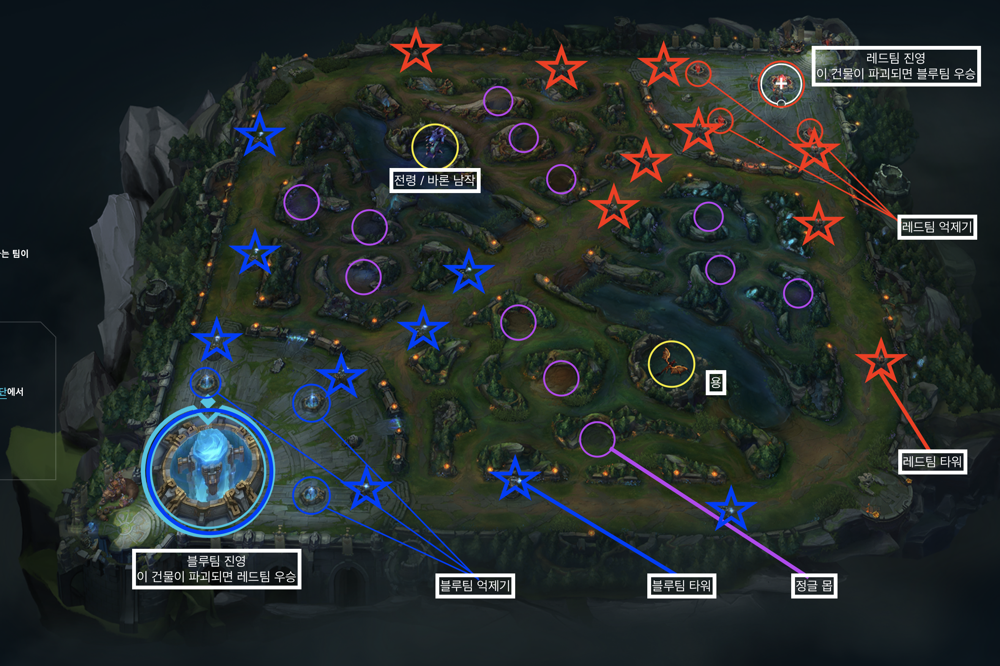

In [2]:
Image("lol.png")

## 전체 데이터
### 마스터 티어, 그랜드마스터 티어, 챌린저 티어의 경기 데이터
#### kaggle(https://www.kaggle.com/gyejr95/league-of-legends-challenger-ranked-games2020)

### 연구 배경 및 목적
#### 게임 데이터 셋으로 승패를 예측하여 승률을 높인다

## 데이터 로드

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
# 1 데이터 로드
m_data = pd.read_csv('Master_Ranked_Games.csv')
m_data
m_data.columns
m_data

,gameId,gameDuraton,blueWins,blueFirstBlood,blueFirstTower,blueFirstBaron,blueFirstDragon,blueFirstInhibitor,blueDragonKills,blueBaronKills,...,redAssist,redChampionDamageDealt,redTotalGold,redTotalMinionKills,redTotalLevel,redAvgLevel,redJungleMinionKills,redKillingSpree,redTotalHeal,redObjectDamageDealt
0,4227123625,1429,0,1,1,0,0,0,0,0,...,45,53831,41991,609,64,12.8,127,4,12916,26338
1,4219545724,1313,0,0,1,0,0,0,0,0,...,43,52924,39672,510,63,12.6,133,4,12252,29828
2,4219463634,1660,1,0,0,1,1,1,1,1,...,22,61745,46516,630,65,13.0,153,2,17005,37066
3,4205778093,984,1,1,1,0,1,0,2,0,...,5,25007,21444,304,41,8.2,51,1,10499,3085
4,4201063474,1437,0,1,1,0,1,0,2,0,...,39,71794,45798,565,68,13.6,150,7,47523,47150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107120,4216107910,2479,1,1,0,0,0,0,3,1,...,41,149798,72167,789,86,17.2,258,6,34890,62124
107121,4031558534,932,0,0,0,0,0,0,0,0,...,26,37534,32931,364,51,10.2,110,5,11983,31400
107122,3882136458,2081,0,1,1,0,0,0,1,0,...,68,97369,71576,797,85,17.0,222,8,33499,79612
107123,4137464714,1619,0,0,0,0,0,0,1,0,...,68,116262,59001,524,72,14.4,162,11,52292,60903


In [5]:
# 2 데이터 로드
g_data = pd.read_csv('GrandMaster_Ranked_Games.csv')
g_data
g_data.columns
g_data

,gameId,gameDuraton,blueWins,blueFirstBlood,blueFirstTower,blueFirstBaron,blueFirstDragon,blueFirstInhibitor,blueDragonKills,blueBaronKills,...,redAssist,redChampionDamageDealt,redTotalGold,redTotalMinionKills,redTotalLevel,redAvgLevel,redJungleMinionKills,redKillingSpree,redTotalHeal,redObjectDamageDealt
0,4241678498,2098,0,0,0,1,1,0,1,1,...,72,125866,70528,832,84,16.8,205,9,65312,88202
1,4233222221,1686,0,0,1,0,0,0,0,0,...,59,78424,58032,640,73,14.6,214,5,31415,61040
2,4233113995,1588,1,1,1,1,0,1,2,1,...,30,62134,47408,608,63,12.6,133,5,27846,32107
3,4229230455,1126,1,0,1,0,1,0,1,0,...,13,32999,32064,461,53,10.6,92,3,23511,10775
4,4228244819,1262,1,0,0,0,1,1,3,0,...,5,35272,35372,506,54,10.8,113,2,17891,24158
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65891,3868504952,1928,0,1,0,0,0,0,2,0,...,60,94554,72361,804,80,16.0,209,10,57739,72450
65892,4110201724,1837,1,1,0,0,1,0,3,0,...,29,88366,52625,660,70,14.0,168,5,25003,45455
65893,4100240254,948,1,1,1,0,0,0,1,0,...,3,16574,20972,351,40,8.0,56,0,7138,6808
65894,4216107910,2479,1,1,0,0,0,0,3,1,...,41,149798,72167,789,86,17.2,258,6,34890,62124


In [6]:
# 3 데이터 로드
c_data = pd.read_csv('Challenger_Ranked_Games.csv')
c_data
c_data.columns
c_data

,gameId,gameDuraton,blueWins,blueFirstBlood,blueFirstTower,blueFirstBaron,blueFirstDragon,blueFirstInhibitor,blueDragonKills,blueBaronKills,...,redAssist,redChampionDamageDealt,redTotalGold,redTotalMinionKills,redTotalLevel,redAvgLevel,redJungleMinionKills,redKillingSpree,redTotalHeal,redObjectDamageDealt
0,4247263043,1323,0,1,0,0,0,0,0,0,...,68,73016,49832,533,64,12.8,138,8,38711,60463
1,4247155821,1317,1,0,0,0,1,0,2,0,...,8,44218,37136,571,59,11.8,134,3,24829,14105
2,4243963257,932,0,0,0,0,0,0,0,0,...,20,30797,35364,400,50,10.0,89,5,12589,45201
3,4241678498,2098,0,0,0,1,1,0,1,1,...,72,125866,70528,832,84,16.8,205,9,65312,88202
4,4241538868,2344,1,1,1,1,1,1,2,2,...,83,131536,74596,794,85,17.0,227,7,86431,64141
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26899,4143231833,1468,0,1,0,0,0,0,1,0,...,40,75531,46558,478,64,12.8,141,6,48596,42733
26900,4157911901,970,0,1,1,0,1,0,3,0,...,31,99837,70177,455,72,14.4,136,11,15817,50217
26901,3764171638,1480,0,1,1,0,1,0,1,0,...,34,55214,48849,636,66,13.2,175,6,25448,27675
26902,4110201724,1837,1,1,0,0,1,0,3,0,...,29,88366,52625,660,70,14.0,168,5,25003,45455


In [7]:
raw_data = pd.concat([m_data, g_data, c_data], ignore_index = True)
#concat은 여러개의 데이터 프레임을 합할 때 주로 사용

In [8]:
raw_data

,gameId,gameDuraton,blueWins,blueFirstBlood,blueFirstTower,blueFirstBaron,blueFirstDragon,blueFirstInhibitor,blueDragonKills,blueBaronKills,...,redAssist,redChampionDamageDealt,redTotalGold,redTotalMinionKills,redTotalLevel,redAvgLevel,redJungleMinionKills,redKillingSpree,redTotalHeal,redObjectDamageDealt
0,4227123625,1429,0,1,1,0,0,0,0,0,...,45,53831,41991,609,64,12.8,127,4,12916,26338
1,4219545724,1313,0,0,1,0,0,0,0,0,...,43,52924,39672,510,63,12.6,133,4,12252,29828
2,4219463634,1660,1,0,0,1,1,1,1,1,...,22,61745,46516,630,65,13.0,153,2,17005,37066
3,4205778093,984,1,1,1,0,1,0,2,0,...,5,25007,21444,304,41,8.2,51,1,10499,3085
4,4201063474,1437,0,1,1,0,1,0,2,0,...,39,71794,45798,565,68,13.6,150,7,47523,47150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199920,4143231833,1468,0,1,0,0,0,0,1,0,...,40,75531,46558,478,64,12.8,141,6,48596,42733
199921,4157911901,970,0,1,1,0,1,0,3,0,...,31,99837,70177,455,72,14.4,136,11,15817,50217
199922,3764171638,1480,0,1,1,0,1,0,1,0,...,34,55214,48849,636,66,13.2,175,6,25448,27675
199923,4110201724,1837,1,1,0,0,1,0,3,0,...,29,88366,52625,660,70,14.0,168,5,25003,45455


In [9]:
# 데이터 프레임 결측치 확인
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 199925 entries, 0 to 199924
Data columns (total 50 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   gameId                   199925 non-null  int64  
 1   gameDuraton              199925 non-null  int64  
 2   blueWins                 199925 non-null  int64  
 3   blueFirstBlood           199925 non-null  int64  
 4   blueFirstTower           199925 non-null  int64  
 5   blueFirstBaron           199925 non-null  int64  
 6   blueFirstDragon          199925 non-null  int64  
 7   blueFirstInhibitor       199925 non-null  int64  
 8   blueDragonKills          199925 non-null  int64  
 9   blueBaronKills           199925 non-null  int64  
 10  blueTowerKills           199925 non-null  int64  
 11  blueInhibitorKills       199925 non-null  int64  
 12  blueWardPlaced           199925 non-null  int64  
 13  blueWardkills            199925 non-null  int64  
 14  blue

## 데이터 전처리 과정 : 블루팀, 레드팀의 승패여부와 첫 킬, 첫 타워, 첫 바론, 첫 용, 첫 억제기를 하나의 컬럼으로 통합
## 레드팀의 승리일 경우 Wins : 0
## 블루팀의 승리일 경우 Wins : 1

### redFirstBlood : red team whether first blood : 0
### redFirstTower : red team whether first tower : 0
### redFirstBaron : red team whether first baron : 0
### redFirstDragon : red team whether first dragon : 0
### redFirstInhibitor : red team whether first inhibitor : 0
#### 1. red혹은 blue로만 나누어진 row이기때문에 중복 컬럼을 drop하고 나머지 컬럼의 이름을 변경해준다

In [10]:
raw_data = raw_data.drop('gameId', axis=1)
raw_data

,gameDuraton,blueWins,blueFirstBlood,blueFirstTower,blueFirstBaron,blueFirstDragon,blueFirstInhibitor,blueDragonKills,blueBaronKills,blueTowerKills,...,redAssist,redChampionDamageDealt,redTotalGold,redTotalMinionKills,redTotalLevel,redAvgLevel,redJungleMinionKills,redKillingSpree,redTotalHeal,redObjectDamageDealt
0,1429,0,1,1,0,0,0,0,0,4,...,45,53831,41991,609,64,12.8,127,4,12916,26338
1,1313,0,0,1,0,0,0,0,0,3,...,43,52924,39672,510,63,12.6,133,4,12252,29828
2,1660,1,0,0,1,1,1,1,1,9,...,22,61745,46516,630,65,13.0,153,2,17005,37066
3,984,1,1,1,0,1,0,2,0,5,...,5,25007,21444,304,41,8.2,51,1,10499,3085
4,1437,0,1,1,0,1,0,2,0,3,...,39,71794,45798,565,68,13.6,150,7,47523,47150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199920,1468,0,1,0,0,0,0,1,0,0,...,40,75531,46558,478,64,12.8,141,6,48596,42733
199921,970,0,1,1,0,1,0,3,0,5,...,31,99837,70177,455,72,14.4,136,11,15817,50217
199922,1480,0,1,1,0,1,0,1,0,4,...,34,55214,48849,636,66,13.2,175,6,25448,27675
199923,1837,1,1,0,0,1,0,3,0,5,...,29,88366,52625,660,70,14.0,168,5,25003,45455


In [11]:
raw_data = raw_data.drop(['redWins', 'redFirstBlood', 'redFirstTower', 
                          'redFirstBaron', 'redFirstDragon', 'redFirstInhibitor'], axis=1)
raw_data.rename(columns={'blueWins':'Wins', 'blueFirstBlood':'FirstBlood', 'blueFirstTower':'FirstTower', 
                          'blueFirstBaron':'FirstBaron', 'blueFirstDragon':'FirstDragon', 
                         'blueFirstInhibitor':'FirstInhibitor'}, inplace=True)
raw_data

,gameDuraton,Wins,FirstBlood,FirstTower,FirstBaron,FirstDragon,FirstInhibitor,blueDragonKills,blueBaronKills,blueTowerKills,...,redAssist,redChampionDamageDealt,redTotalGold,redTotalMinionKills,redTotalLevel,redAvgLevel,redJungleMinionKills,redKillingSpree,redTotalHeal,redObjectDamageDealt
0,1429,0,1,1,0,0,0,0,0,4,...,45,53831,41991,609,64,12.8,127,4,12916,26338
1,1313,0,0,1,0,0,0,0,0,3,...,43,52924,39672,510,63,12.6,133,4,12252,29828
2,1660,1,0,0,1,1,1,1,1,9,...,22,61745,46516,630,65,13.0,153,2,17005,37066
3,984,1,1,1,0,1,0,2,0,5,...,5,25007,21444,304,41,8.2,51,1,10499,3085
4,1437,0,1,1,0,1,0,2,0,3,...,39,71794,45798,565,68,13.6,150,7,47523,47150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199920,1468,0,1,0,0,0,0,1,0,0,...,40,75531,46558,478,64,12.8,141,6,48596,42733
199921,970,0,1,1,0,1,0,3,0,5,...,31,99837,70177,455,72,14.4,136,11,15817,50217
199922,1480,0,1,1,0,1,0,1,0,4,...,34,55214,48849,636,66,13.2,175,6,25448,27675
199923,1837,1,1,0,0,1,0,3,0,5,...,29,88366,52625,660,70,14.0,168,5,25003,45455


In [12]:
raw_data['Wins'].value_counts()

0    100771
1     99154
Name: Wins, dtype: int64

In [13]:
# 거의 비슷한 확률로 승리를 하지만 red팀일때 근소한 차이로 이길 확률이 더 높았다.

In [14]:
# 데이터 프레임 통계량 요약
raw_data.describe()

,gameDuraton,Wins,FirstBlood,FirstTower,FirstBaron,FirstDragon,FirstInhibitor,blueDragonKills,blueBaronKills,blueTowerKills,...,redAssist,redChampionDamageDealt,redTotalGold,redTotalMinionKills,redTotalLevel,redAvgLevel,redJungleMinionKills,redKillingSpree,redTotalHeal,redObjectDamageDealt
count,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,...,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000
mean,1433.434008,0.495956,0.506535,0.515863,0.236684,0.403616,0.382794,1.356744,0.297737,4.343939,...,40.247978,69241.998725,48022.229046,505.554458,64.914903,12.982981,125.729318,5.682716,24775.338692,36892.539087
std,432.490237,0.499985,0.499959,0.499750,0.425048,0.490623,0.486070,1.254504,0.535042,3.377381,...,29.041446,37440.925824,16271.618084,181.302212,14.953548,2.990710,66.887707,3.633332,15428.891250,26916.048868
min,132.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1125.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,20.000000,41312.000000,36472.000000,386.000000,55.000000,11.000000,84.000000,3.000000,13596.000000,12739.000000
50%,1420.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,4.000000,...,35.000000,64284.000000,48029.000000,522.000000,66.000000,13.200000,128.000000,5.000000,21733.000000,32483.000000
75%,1732.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,2.000000,1.000000,7.000000,...,54.000000,90679.000000,59101.000000,631.000000,75.000000,15.000000,172.000000,8.000000,32589.000000,57311.000000
max,3758.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000,4.000000,11.000000,...,229.000000,359184.000000,141692.000000,1443.000000,145.000000,29.000000,488.000000,29.000000,206758.000000,197135.000000


In [15]:
# 항목별 타입을 한꺼번에 보여줌
raw_data.dtypes

gameDuraton                  int64
Wins                         int64
FirstBlood                   int64
FirstTower                   int64
FirstBaron                   int64
FirstDragon                  int64
FirstInhibitor               int64
blueDragonKills              int64
blueBaronKills               int64
blueTowerKills               int64
blueInhibitorKills           int64
blueWardPlaced               int64
blueWardkills                int64
blueKills                    int64
blueDeath                    int64
blueAssist                   int64
blueChampionDamageDealt      int64
blueTotalGold                int64
blueTotalMinionKills         int64
blueTotalLevel               int64
blueAvgLevel               float64
blueJungleMinionKills        int64
blueKillingSpree             int64
blueTotalHeal                int64
blueObjectDamageDealt        int64
redDragonKills               int64
redBaronKills                int64
redTowerKills                int64
redInhibitorKills   

In [16]:
# 피쳐간 상관관계 확인
data_corr = raw_data.corr()
data_corr

,gameDuraton,Wins,FirstBlood,FirstTower,FirstBaron,FirstDragon,FirstInhibitor,blueDragonKills,blueBaronKills,blueTowerKills,...,redAssist,redChampionDamageDealt,redTotalGold,redTotalMinionKills,redTotalLevel,redAvgLevel,redJungleMinionKills,redKillingSpree,redTotalHeal,redObjectDamageDealt
gameDuraton,1.000000,-0.017400,0.000679,0.048105,0.402692,0.090814,0.166644,0.492729,0.499360,0.401790,...,0.346682,0.682887,0.769200,0.899024,0.748110,0.748110,0.785338,0.357951,0.713713,0.631999
Wins,-0.017400,1.000000,0.206563,0.465065,0.366600,0.271273,0.658354,0.454920,0.353205,0.717463,...,-0.334433,-0.172681,-0.274216,-0.101708,-0.219959,-0.219959,-0.239547,-0.399225,-0.221568,-0.551108
FirstBlood,0.000679,0.206563,1.000000,0.216389,0.053508,0.140890,0.154985,0.135877,0.045859,0.189529,...,-0.089084,-0.044435,-0.078686,-0.032571,-0.051538,-0.051538,-0.054651,-0.127939,-0.037410,-0.141499
FirstTower,0.048105,0.465065,0.216389,1.000000,0.141800,0.214170,0.383554,0.293822,0.120063,0.487180,...,-0.139281,-0.070325,-0.125392,-0.019470,-0.064877,-0.064877,-0.118129,-0.227629,-0.053080,-0.317809
FirstBaron,0.402692,0.366600,0.053508,0.141800,1.000000,0.129840,0.408707,0.434385,0.884838,0.528745,...,-0.049117,0.170710,0.181724,0.387567,0.185880,0.185880,0.255836,-0.038780,0.174320,0.002193
FirstDragon,0.090814,0.271273,0.140890,0.214170,0.129840,1.000000,0.176714,0.586840,0.121506,0.291841,...,-0.225583,-0.105223,-0.103478,0.115850,-0.097293,-0.097293,0.062164,-0.220903,-0.058365,-0.133633
FirstInhibitor,0.166644,0.658354,0.154985,0.383554,0.408707,0.176714,1.000000,0.402066,0.386185,0.778773,...,-0.098674,0.051554,-0.006476,0.056634,0.036947,0.036947,-0.109137,-0.159708,-0.012477,-0.328405
blueDragonKills,0.492729,0.454920,0.135877,0.293822,0.434385,0.586840,0.402066,1.000000,0.468501,0.622092,...,-0.159877,0.140561,0.165262,0.479641,0.163994,0.163994,0.330644,-0.156017,0.185452,-0.003144
blueBaronKills,0.499360,0.353205,0.045859,0.120063,0.884838,0.121506,0.386185,0.468501,1.000000,0.541740,...,0.006858,0.263787,0.273392,0.462183,0.258905,0.258905,0.333771,0.016702,0.266525,0.084731
blueTowerKills,0.401790,0.717463,0.189529,0.487180,0.528745,0.291841,0.778773,0.622092,0.541740,1.000000,...,-0.139654,0.139879,0.106375,0.302411,0.134178,0.134178,0.112002,-0.172294,0.118318,-0.182066


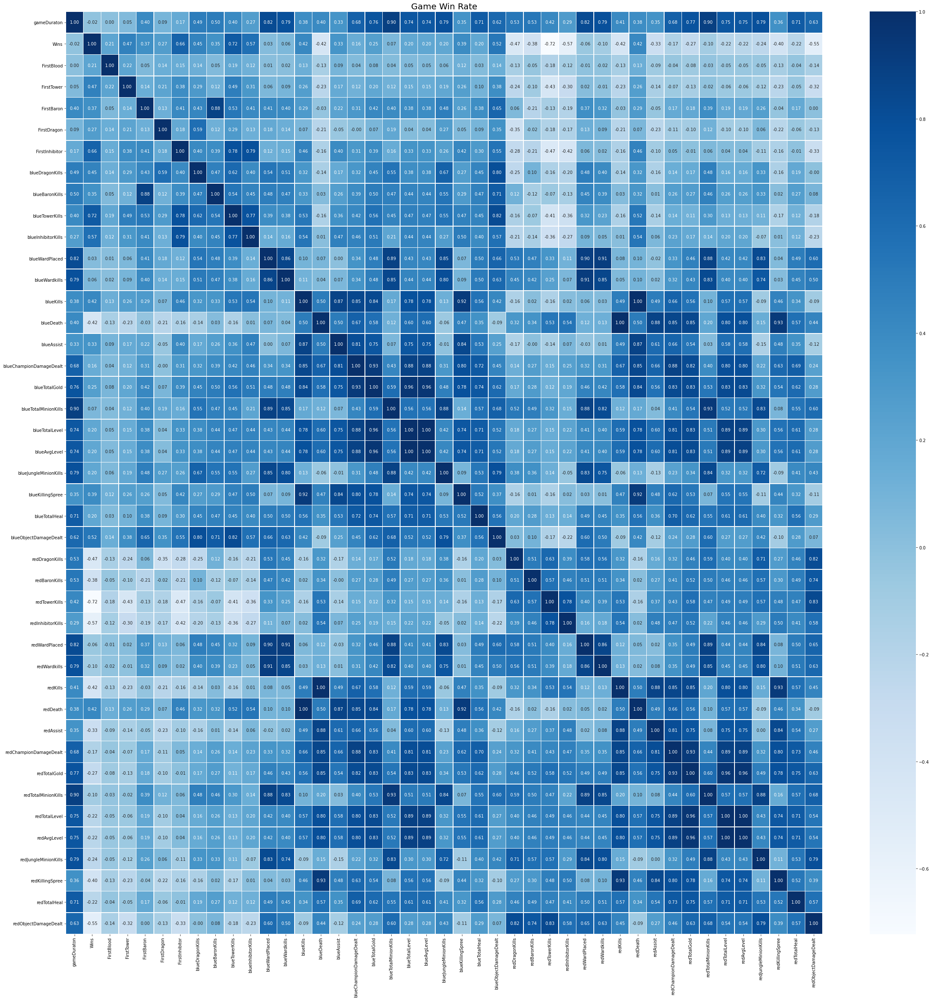

In [17]:
# 상관관계 분석을 히트맵으로 시각화
plt.figure(figsize=(40,40)) # 15*15사이즈로 작성
sns.heatmap(data=data_corr, annot=True, fmt='.2f', linewidths=.5, cmap='Blues')
plt.title('Game Win Rate', fontsize=20)
plt.show()

In [17]:
# 팀을 나누어 데이터를 정리
blue_data = raw_data[['gameDuraton', 'Wins', 'FirstBlood', 'FirstTower', 'FirstBaron', 'FirstDragon', 'FirstInhibitor', 
                      'blueDragonKills', 'blueBaronKills', 'blueTowerKills', 'blueInhibitorKills', 'blueWardPlaced', 
                      'blueWardkills', 'blueKills', 'blueDeath', 'blueAssist', 'blueChampionDamageDealt', 'blueTotalGold', 
                      'blueTotalMinionKills', 'blueTotalLevel', 'blueAvgLevel', 'blueJungleMinionKills', 'blueKillingSpree', 
                      'blueTotalHeal', 'blueObjectDamageDealt']]
blue_data

,gameDuraton,Wins,FirstBlood,FirstTower,FirstBaron,FirstDragon,FirstInhibitor,blueDragonKills,blueBaronKills,blueTowerKills,...,blueAssist,blueChampionDamageDealt,blueTotalGold,blueTotalMinionKills,blueTotalLevel,blueAvgLevel,blueJungleMinionKills,blueKillingSpree,blueTotalHeal,blueObjectDamageDealt
0,1429,0,1,1,0,0,0,0,0,4,...,13,42979,41910,646,60,12.0,180,2,15575,35335
1,1313,0,0,1,0,0,0,0,0,3,...,9,36087,35880,563,56,11.2,119,1,13059,26348
2,1660,1,0,0,1,1,1,1,1,9,...,61,64708,58214,651,74,14.8,209,7,37288,64577
3,984,1,1,1,0,1,0,2,0,5,...,34,45772,36545,402,53,10.6,102,6,14093,31303
4,1437,0,1,1,0,1,0,2,0,3,...,22,79501,42395,528,60,12.0,96,5,23863,30643
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199920,1468,0,1,0,0,0,0,1,0,0,...,50,99418,41437,438,60,12.0,106,8,20122,13309
199921,970,0,1,1,0,1,0,3,0,5,...,36,61816,61221,346,65,13.0,28,5,32837,44640
199922,1480,0,1,1,0,1,0,1,0,4,...,19,51604,45013,568,63,12.6,132,4,18131,45242
199923,1837,1,1,0,0,1,0,3,0,5,...,66,93059,58160,640,76,15.2,168,7,75427,60486


In [18]:
# 피쳐간 상관관계 확인
blue_data_corr = blue_data.corr()
blue_data_corr

,gameDuraton,Wins,FirstBlood,FirstTower,FirstBaron,FirstDragon,FirstInhibitor,blueDragonKills,blueBaronKills,blueTowerKills,...,blueAssist,blueChampionDamageDealt,blueTotalGold,blueTotalMinionKills,blueTotalLevel,blueAvgLevel,blueJungleMinionKills,blueKillingSpree,blueTotalHeal,blueObjectDamageDealt
gameDuraton,1.000000,-0.017400,0.000679,0.048105,0.402692,0.090814,0.166644,0.492729,0.499360,0.401790,...,0.332213,0.676395,0.762912,0.897155,0.742300,0.742300,0.786882,0.345554,0.709589,0.624440
Wins,-0.017400,1.000000,0.206563,0.465065,0.366600,0.271273,0.658354,0.454920,0.353205,0.717463,...,0.333881,0.158049,0.253280,0.068853,0.197920,0.197920,0.199203,0.391922,0.197769,0.522638
FirstBlood,0.000679,0.206563,1.000000,0.216389,0.053508,0.140890,0.154985,0.135877,0.045859,0.189529,...,0.085046,0.040506,0.077314,0.037020,0.050645,0.050645,0.055741,0.122588,0.032841,0.143244
FirstTower,0.048105,0.465065,0.216389,1.000000,0.141800,0.214170,0.383554,0.293822,0.120063,0.487180,...,0.167282,0.116505,0.199096,0.116529,0.154996,0.154996,0.189912,0.256141,0.103744,0.380466
FirstBaron,0.402692,0.366600,0.053508,0.141800,1.000000,0.129840,0.408707,0.434385,0.884838,0.528745,...,0.221837,0.305405,0.419687,0.400900,0.381655,0.381655,0.481974,0.259830,0.378193,0.647758
FirstDragon,0.090814,0.271273,0.140890,0.214170,0.129840,1.000000,0.176714,0.586840,0.121506,0.291841,...,-0.051311,-0.003708,0.073745,0.190571,0.036522,0.036522,0.267940,0.049871,0.085514,0.351228
FirstInhibitor,0.166644,0.658354,0.154985,0.383554,0.408707,0.176714,1.000000,0.402066,0.386185,0.778773,...,0.397389,0.309649,0.388722,0.158538,0.334805,0.334805,0.258629,0.423076,0.295106,0.552440
blueDragonKills,0.492729,0.454920,0.135877,0.293822,0.434385,0.586840,0.402066,1.000000,0.468501,0.622092,...,0.166110,0.318039,0.449283,0.552818,0.379819,0.379819,0.668745,0.272486,0.448018,0.800184
blueBaronKills,0.499360,0.353205,0.045859,0.120063,0.884838,0.121506,0.386185,0.468501,1.000000,0.541740,...,0.260986,0.389665,0.498660,0.471413,0.444919,0.444919,0.545140,0.290546,0.467044,0.713595
blueTowerKills,0.401790,0.717463,0.189529,0.487180,0.528745,0.291841,0.778773,0.622092,0.541740,1.000000,...,0.360063,0.416063,0.564533,0.451910,0.469653,0.469653,0.550014,0.466883,0.452398,0.823915


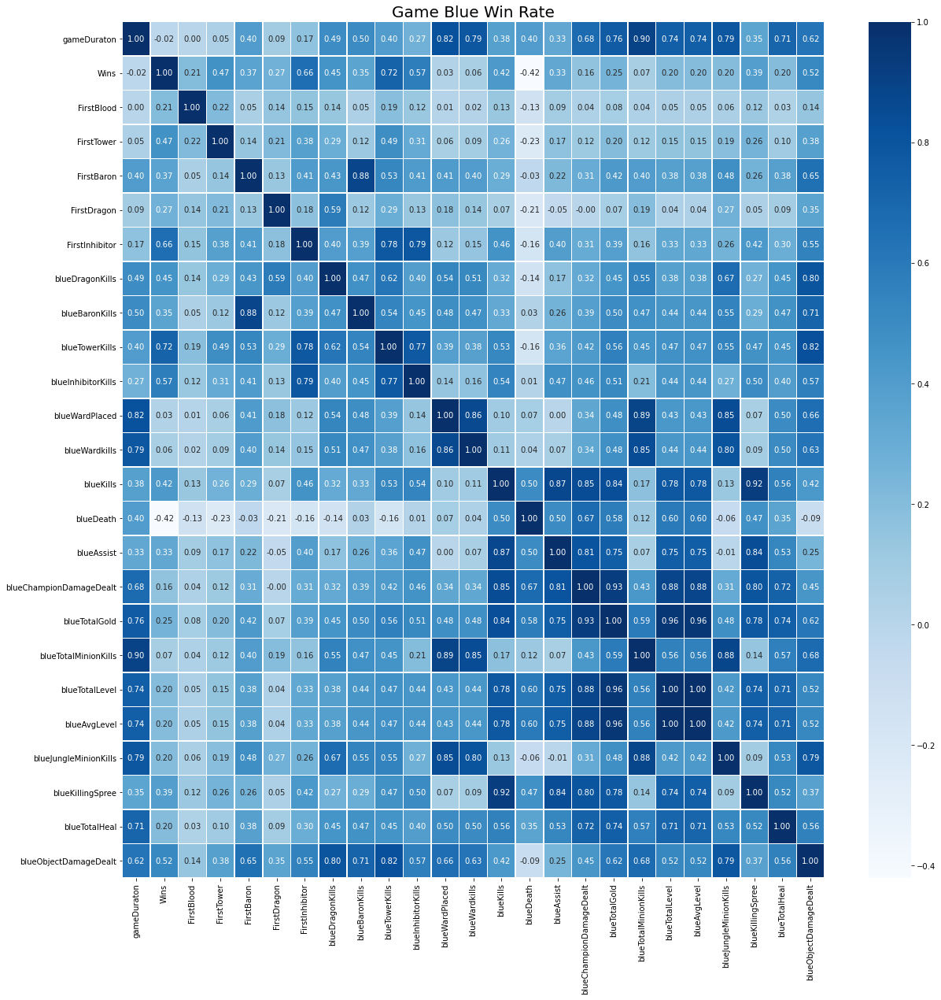

In [23]:
# 상관관계 분석을 히트맵으로 시각화
plt.figure(figsize=(20,20)) # 15*15사이즈로 작성
sns.heatmap(data=blue_data_corr, annot=True, fmt='.2f', linewidths=.5, cmap='Blues')
plt.title('Game Blue Win Rate', fontsize=20)
plt.show()

In [19]:
# 팀을 나누어 데이터를 정리
red_data = raw_data[['gameDuraton', 'Wins', 'FirstBlood', 'FirstTower', 'FirstBaron', 'FirstDragon', 'FirstInhibitor', 
                      'redDragonKills', 'redBaronKills', 'redTowerKills', 'redInhibitorKills', 'redWardPlaced', 
                      'redWardkills', 'redKills', 'redDeath', 'redAssist', 'redChampionDamageDealt', 'redTotalGold', 
                      'redTotalMinionKills', 'redTotalLevel', 'redAvgLevel', 'redJungleMinionKills', 'redKillingSpree', 
                      'redTotalHeal', 'redObjectDamageDealt']]
red_data

,gameDuraton,Wins,FirstBlood,FirstTower,FirstBaron,FirstDragon,FirstInhibitor,redDragonKills,redBaronKills,redTowerKills,...,redAssist,redChampionDamageDealt,redTotalGold,redTotalMinionKills,redTotalLevel,redAvgLevel,redJungleMinionKills,redKillingSpree,redTotalHeal,redObjectDamageDealt
0,1429,0,1,1,0,0,0,3,0,2,...,45,53831,41991,609,64,12.8,127,4,12916,26338
1,1313,0,0,1,0,0,0,2,0,1,...,43,52924,39672,510,63,12.6,133,4,12252,29828
2,1660,1,0,0,1,1,1,2,0,3,...,22,61745,46516,630,65,13.0,153,2,17005,37066
3,984,1,1,1,0,1,0,0,0,0,...,5,25007,21444,304,41,8.2,51,1,10499,3085
4,1437,0,1,1,0,1,0,1,0,4,...,39,71794,45798,565,68,13.6,150,7,47523,47150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199920,1468,0,1,0,0,0,0,2,0,4,...,40,75531,46558,478,64,12.8,141,6,48596,42733
199921,970,0,1,1,0,1,0,0,0,10,...,31,99837,70177,455,72,14.4,136,11,15817,50217
199922,1480,0,1,1,0,1,0,1,0,3,...,34,55214,48849,636,66,13.2,175,6,25448,27675
199923,1837,1,1,0,0,1,0,2,1,4,...,29,88366,52625,660,70,14.0,168,5,25003,45455


In [20]:
# 피쳐간 상관관계 확인
red_data_corr = red_data.corr()
red_data_corr

,gameDuraton,Wins,FirstBlood,FirstTower,FirstBaron,FirstDragon,FirstInhibitor,redDragonKills,redBaronKills,redTowerKills,...,redAssist,redChampionDamageDealt,redTotalGold,redTotalMinionKills,redTotalLevel,redAvgLevel,redJungleMinionKills,redKillingSpree,redTotalHeal,redObjectDamageDealt
gameDuraton,1.000000,-0.017400,0.000679,0.048105,0.402692,0.090814,0.166644,0.527186,0.528664,0.420457,...,0.346682,0.682887,0.769200,0.899024,0.748110,0.748110,0.785338,0.357951,0.713713,0.631999
Wins,-0.017400,1.000000,0.206563,0.465065,0.366600,0.271273,0.658354,-0.465617,-0.379211,-0.722430,...,-0.334433,-0.172681,-0.274216,-0.101708,-0.219959,-0.219959,-0.239547,-0.399225,-0.221568,-0.551108
FirstBlood,0.000679,0.206563,1.000000,0.216389,0.053508,0.140890,0.154985,-0.131899,-0.046723,-0.182409,...,-0.089084,-0.044435,-0.078686,-0.032571,-0.051538,-0.051538,-0.054651,-0.127939,-0.037410,-0.141499
FirstTower,0.048105,0.465065,0.216389,1.000000,0.141800,0.214170,0.383554,-0.239706,-0.095948,-0.434115,...,-0.139281,-0.070325,-0.125392,-0.019470,-0.064877,-0.064877,-0.118129,-0.227629,-0.053080,-0.317809
FirstBaron,0.402692,0.366600,0.053508,0.141800,1.000000,0.129840,0.408707,0.055768,-0.208919,-0.127929,...,-0.049117,0.170710,0.181724,0.387567,0.185880,0.185880,0.255836,-0.038780,0.174320,0.002193
FirstDragon,0.090814,0.271273,0.140890,0.214170,0.129840,1.000000,0.176714,-0.354476,-0.020965,-0.177018,...,-0.225583,-0.105223,-0.103478,0.115850,-0.097293,-0.097293,0.062164,-0.220903,-0.058365,-0.133633
FirstInhibitor,0.166644,0.658354,0.154985,0.383554,0.408707,0.176714,1.000000,-0.275794,-0.210150,-0.473653,...,-0.098674,0.051554,-0.006476,0.056634,0.036947,0.036947,-0.109137,-0.159708,-0.012477,-0.328405
redDragonKills,0.527186,-0.465617,-0.131899,-0.239706,0.055768,-0.354476,-0.275794,1.000000,0.506658,0.628048,...,0.164619,0.323923,0.462736,0.594707,0.396649,0.396649,0.708044,0.274846,0.457958,0.816239
redBaronKills,0.528664,-0.379211,-0.046723,-0.095948,-0.208919,-0.020965,-0.210150,0.506658,1.000000,0.568108,...,0.274069,0.405597,0.519842,0.500575,0.464052,0.464052,0.572946,0.303639,0.485330,0.739582
redTowerKills,0.420457,-0.722430,-0.182409,-0.434115,-0.127929,-0.177018,-0.473653,0.628048,0.568108,1.000000,...,0.368831,0.429032,0.579663,0.466582,0.488188,0.488188,0.567215,0.477579,0.466454,0.834185


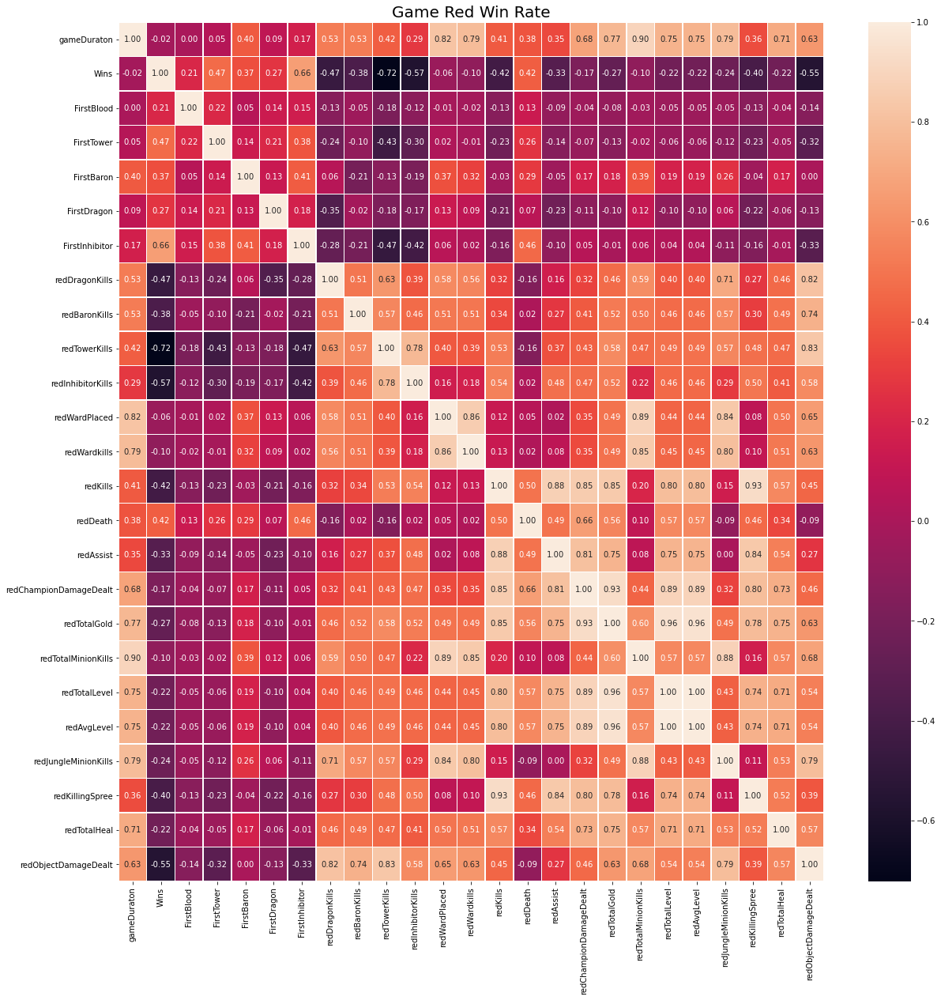

In [26]:
# 상관관계 분석을 히트맵으로 시각화
plt.figure(figsize=(20,20)) # 15*15사이즈로 작성
sns.heatmap(data=red_data_corr, annot=True, fmt='.2f', linewidths=.5)
plt.title('Game Red Win Rate', fontsize=20)
plt.show()

In [21]:
# 게임의 첫 킬, 첫 타워, 첫 바론, 첫 용, 첫 억제기가 승리에 어떤 상관관계를 가지는지 알아보자.

first = raw_data[['Wins', 'FirstBlood', 'FirstTower', 'FirstBaron', 'FirstDragon', 'FirstInhibitor']]
first

,Wins,FirstBlood,FirstTower,FirstBaron,FirstDragon,FirstInhibitor
0,0,1,1,0,0,0
1,0,0,1,0,0,0
2,1,0,0,1,1,1
3,1,1,1,0,1,0
4,0,1,1,0,1,0
...,...,...,...,...,...,...
199920,0,1,0,0,0,0
199921,0,1,1,0,1,0
199922,0,1,1,0,1,0
199923,1,1,0,0,1,0


In [22]:
first_corr = first.corr()
first_corr

,Wins,FirstBlood,FirstTower,FirstBaron,FirstDragon,FirstInhibitor
Wins,1.000000,0.206563,0.465065,0.366600,0.271273,0.658354
FirstBlood,0.206563,1.000000,0.216389,0.053508,0.140890,0.154985
FirstTower,0.465065,0.216389,1.000000,0.141800,0.214170,0.383554
FirstBaron,0.366600,0.053508,0.141800,1.000000,0.129840,0.408707
FirstDragon,0.271273,0.140890,0.214170,0.129840,1.000000,0.176714
FirstInhibitor,0.658354,0.154985,0.383554,0.408707,0.176714,1.000000


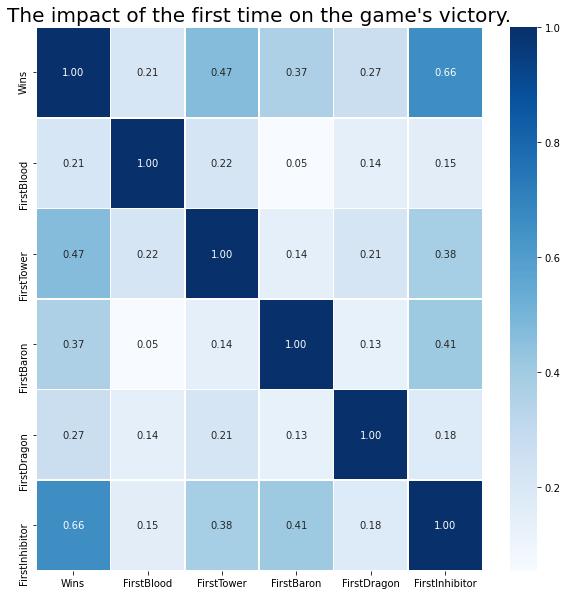

In [23]:
# 상관관계 분석을 히트맵으로 시각화
plt.figure(figsize=(10,10)) # 15*15사이즈로 작성
sns.heatmap(data=first_corr, annot=True, fmt='.2f', linewidths=.5, cmap='Blues')
plt.title("The impact of the first time on the game's victory.", fontsize=20)
plt.show()

In [24]:
# 전체적으로 승리와 가장 높은 상관관계를 가지는 것으로는 부순 타워수, 부순 억제기수가 높은 상관관계를 가졌고,
# 각 팀의 첫 억제기, 타워, 바론, 용, 킬 순으로 높은 상관관계를 보였다.

## 데이터 세트를 시각화

In [25]:
raw_data['Wins'].value_counts(normalize=True)

0    0.504044
1    0.495956
Name: Wins, dtype: float64

<AxesSubplot:>

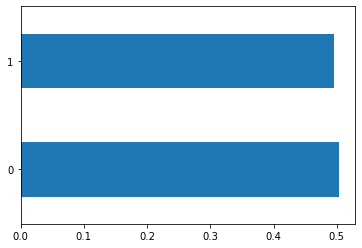

In [26]:
raw_data['Wins'].value_counts(normalize=True).plot(kind='barh')

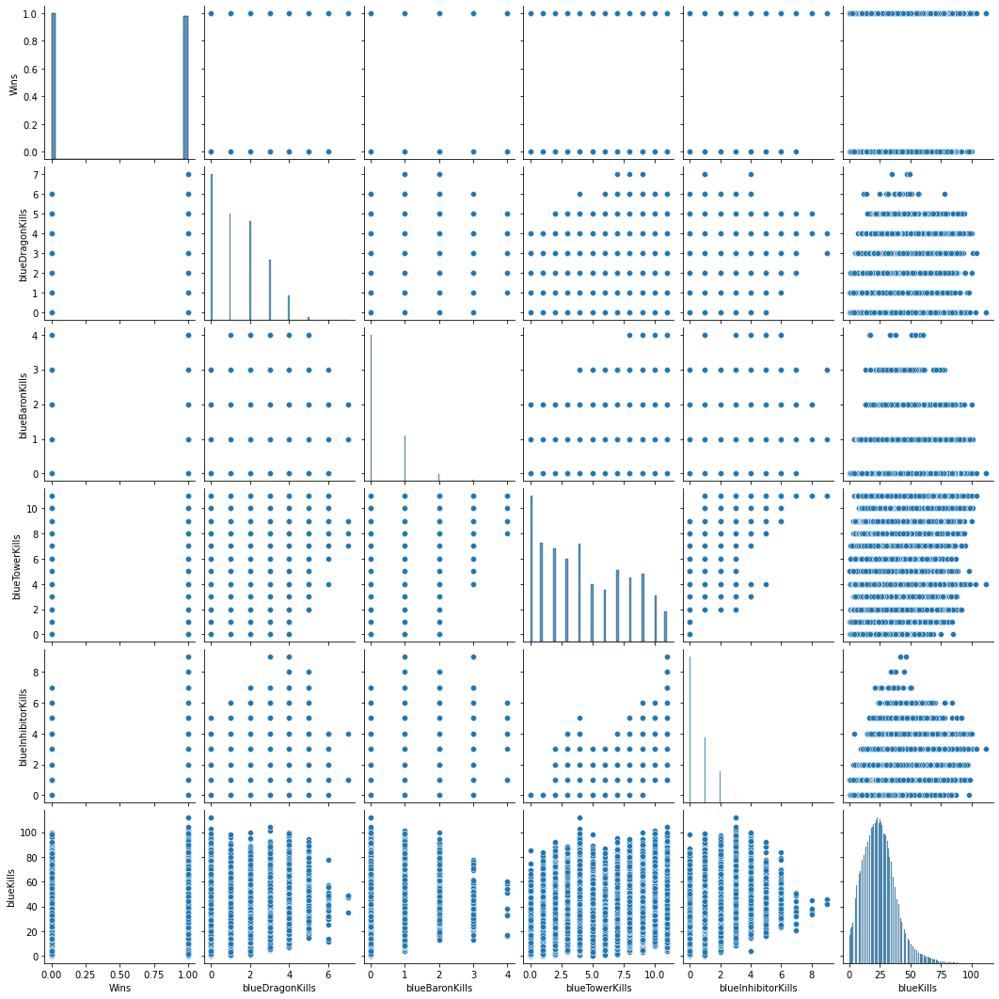

In [33]:
# pairplot사용
# 다른 모든 위치의 산점도를 구축
sns.pairplot(data=raw_data[['Wins', 'blueDragonKills', 'blueBaronKills', 'blueTowerKills', 'blueInhibitorKills', 'blueKills']])

In [27]:
# 숫자 row만 있는 데이터 프레임 생성.
# float64, in64의 데이터 유형만 사용하도록 지정.
raw_data_num = raw_data.select_dtypes(include=['float64', 'int64'])
raw_data_num

,gameDuraton,Wins,FirstBlood,FirstTower,FirstBaron,FirstDragon,FirstInhibitor,blueDragonKills,blueBaronKills,blueTowerKills,...,redAssist,redChampionDamageDealt,redTotalGold,redTotalMinionKills,redTotalLevel,redAvgLevel,redJungleMinionKills,redKillingSpree,redTotalHeal,redObjectDamageDealt
0,1429,0,1,1,0,0,0,0,0,4,...,45,53831,41991,609,64,12.8,127,4,12916,26338
1,1313,0,0,1,0,0,0,0,0,3,...,43,52924,39672,510,63,12.6,133,4,12252,29828
2,1660,1,0,0,1,1,1,1,1,9,...,22,61745,46516,630,65,13.0,153,2,17005,37066
3,984,1,1,1,0,1,0,2,0,5,...,5,25007,21444,304,41,8.2,51,1,10499,3085
4,1437,0,1,1,0,1,0,2,0,3,...,39,71794,45798,565,68,13.6,150,7,47523,47150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199920,1468,0,1,0,0,0,0,1,0,0,...,40,75531,46558,478,64,12.8,141,6,48596,42733
199921,970,0,1,1,0,1,0,3,0,5,...,31,99837,70177,455,72,14.4,136,11,15817,50217
199922,1480,0,1,1,0,1,0,1,0,4,...,34,55214,48849,636,66,13.2,175,6,25448,27675
199923,1837,1,1,0,0,1,0,3,0,5,...,29,88366,52625,660,70,14.0,168,5,25003,45455


array([[<AxesSubplot:title={'center':'gameDuraton'}>,
        <AxesSubplot:title={'center':'Wins'}>,
        <AxesSubplot:title={'center':'FirstBlood'}>,
        <AxesSubplot:title={'center':'FirstTower'}>,
        <AxesSubplot:title={'center':'FirstBaron'}>,
        <AxesSubplot:title={'center':'FirstDragon'}>,
        <AxesSubplot:title={'center':'FirstInhibitor'}>],
       [<AxesSubplot:title={'center':'blueDragonKills'}>,
        <AxesSubplot:title={'center':'blueBaronKills'}>,
        <AxesSubplot:title={'center':'blueTowerKills'}>,
        <AxesSubplot:title={'center':'blueInhibitorKills'}>,
        <AxesSubplot:title={'center':'blueWardPlaced'}>,
        <AxesSubplot:title={'center':'blueWardkills'}>,
        <AxesSubplot:title={'center':'blueKills'}>],
       [<AxesSubplot:title={'center':'blueDeath'}>,
        <AxesSubplot:title={'center':'blueAssist'}>,
        <AxesSubplot:title={'center':'blueChampionDamageDealt'}>,
        <AxesSubplot:title={'center':'blueTotalGold'}>,
  

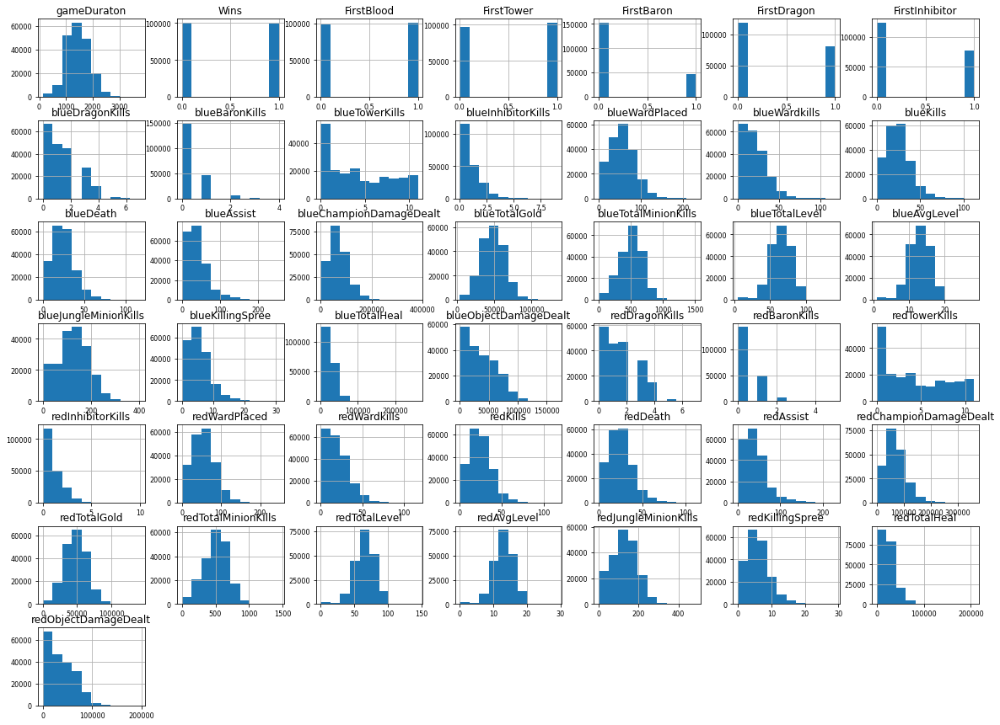

In [28]:
raw_data_num.hist(figsize=[20, 15], bins=10, xlabelsize=8, ylabelsize=8)
# 매개변수에서 플롯의 크기, 레이블 크기, 빈 갯수를 설정해줌.

# 제거된 타워수에 따른 승패예측
## 4개 혹은 7개 이상 타워가 제거되었을때 승리할 확률이 높았다.

In [29]:
# 가장 큰 양의 상관관계를 가지는 컬럼 (제거한 총 타워수)

In [30]:
# 블루팀의 타워 제거-블루팀이 승리한 게임의 데이터프레임
to_data = raw_data[['blueTowerKills', 'Wins']]
blue_to_data = to_data[to_data['Wins'] == 1] # 제거된 타워수-블루팀이 승리한 게임의 데이터프레임
blue_to_data

blue_to_data = blue_to_data.groupby('blueTowerKills').count()
blue_to_data

,Wins
blueTowerKills,
0,1258
1,1133
2,3386
3,5521
4,13611
5,7758
6,8446
7,13918
8,13201


In [31]:
# 레드팀의 타워 제거-레드팀이 승리한 게임의 데이터프레임
to_data = raw_data[['redTowerKills', 'Wins']]
red_to_data = to_data[to_data['Wins'] == 0] # 제거된 타워수-레드팀이 승리한 게임의 데이터프레임
red_to_data

red_to_data = red_to_data.groupby('redTowerKills').count()
red_to_data

,Wins
redTowerKills,
0,1390
1,1278
2,3822
3,6319
4,13836
5,7521
6,8694
7,14024
8,13361


Text(0.5, 0, 'Tower Kills')

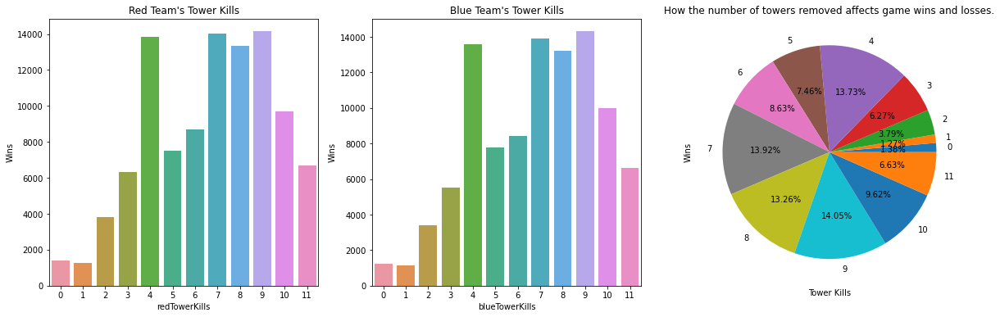

In [38]:
import matplotlib as mpl

f, ax = plt.subplots(1, 3, figsize = [20, 6])

ax[0].set_title("Red Team's Tower Kills")
sns.barplot(data = red_to_data.reset_index(), x = "redTowerKills", y = "Wins",ax = ax[0], ci = None )

ax[1].set_title("Blue Team's Tower Kills")
sns.barplot(data = blue_to_data.reset_index(), x = "blueTowerKills", y = "Wins",ax = ax[1], ci = None )

labels = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11']
ax[2].set_title("How the number of towers removed affects game wins and losses.")
# 제거된 타워의 수가 게임 승패에 어떤 영향을 미치는지.
red_to_data.reset_index()['Wins'].plot.pie(labels=labels, autopct = "%1.2f%%", ax = ax[2])
ax[2].set_xlabel("Tower Kills")

# 첫번째 억제기의 제거에 따른 승패예측

### 블루팀, 레드팀 모두 첫 억제기를 제거하였을 경우 승리할 확률이 올라간다.
### 블루팀은 레드팀에 비해 첫 억제기를 제거하지 못하여도 승리할 확률이 더 높다.

In [32]:
f_inhi = raw_data[['FirstInhibitor', 'Wins']]
f_inhi

,FirstInhibitor,Wins
0,0,0
1,0,0
2,1,1
3,0,1
4,0,0
...,...,...
199920,0,0
199921,0,0
199922,0,0
199923,0,1


In [33]:
f_inhi['FirstInhibitor'].value_counts()

0    123395
1     76530
Name: FirstInhibitor, dtype: int64

In [34]:
f1 = f_inhi[f_inhi['FirstInhibitor'] == 1] # 블루팀이 첫 억제기를 제거했을때
f1[f1['Wins']==1] # 블루팀이 승리했을때

,FirstInhibitor,Wins
2,1,1
6,1,1
8,1,1
9,1,1
10,1,1
...,...,...
199907,1,1
199908,1,1
199913,1,1
199916,1,1


In [35]:
f1[f1['Wins']==0] # 블루팀이 첫 억제기를 제거하고 우승은 레드팀이 했을때

,FirstInhibitor,Wins
62,1,0
91,1,0
122,1,0
165,1,0
172,1,0
...,...,...
199571,1,0
199605,1,0
199704,1,0
199758,1,0


In [36]:
f2 = f_inhi[f_inhi['FirstInhibitor'] == 0] # 레드팀이 첫 억제기를 제거했을때
f2

,FirstInhibitor,Wins
0,0,0
1,0,0
3,0,1
4,0,0
5,0,1
...,...,...
199920,0,0
199921,0,0
199922,0,0
199923,0,1


In [37]:
f_inhi_mean = f_inhi.groupby('FirstInhibitor').mean()
f_inhi_mean

,Wins
FirstInhibitor,
0,0.236728
1,0.913929


In [38]:
f_inhi.value_counts()

FirstInhibitor  Wins
0               0       94184
1               1       69943
0               1       29211
1               0        6587
dtype: int64

<AxesSubplot:title={'center':"Red team's First Inhibitor."}, xlabel='FirstInhibitor', ylabel='Wins'>

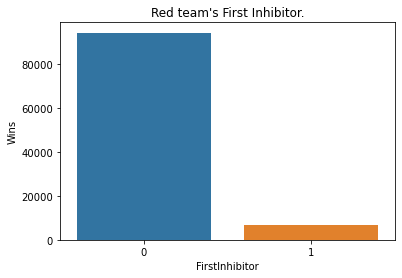

In [39]:
a = raw_data[['FirstInhibitor', 'Wins']]
b = a[a.Wins == 0]
b

plt.title("Red team's First Inhibitor.")
sns.barplot(data=b.groupby('FirstInhibitor').count().reset_index(), x = 'FirstInhibitor', y = 'Wins')

<AxesSubplot:title={'center':"Blue team's First Inhibitor."}, xlabel='FirstInhibitor', ylabel='Wins'>

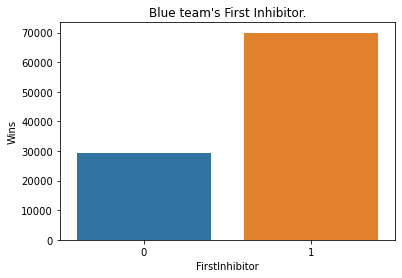

In [40]:
c = raw_data[['FirstInhibitor', 'Wins']]
d = c[c.Wins == 1]
d

plt.title("Blue team's First Inhibitor.")
sns.barplot(data=d.groupby('FirstInhibitor').count().reset_index(), x = 'FirstInhibitor', y = 'Wins')

<AxesSubplot:title={'center':'Percentage of each team removing the first tower based on the first inhibitor'}, xlabel='FirstInhibitor', ylabel='Wins'>

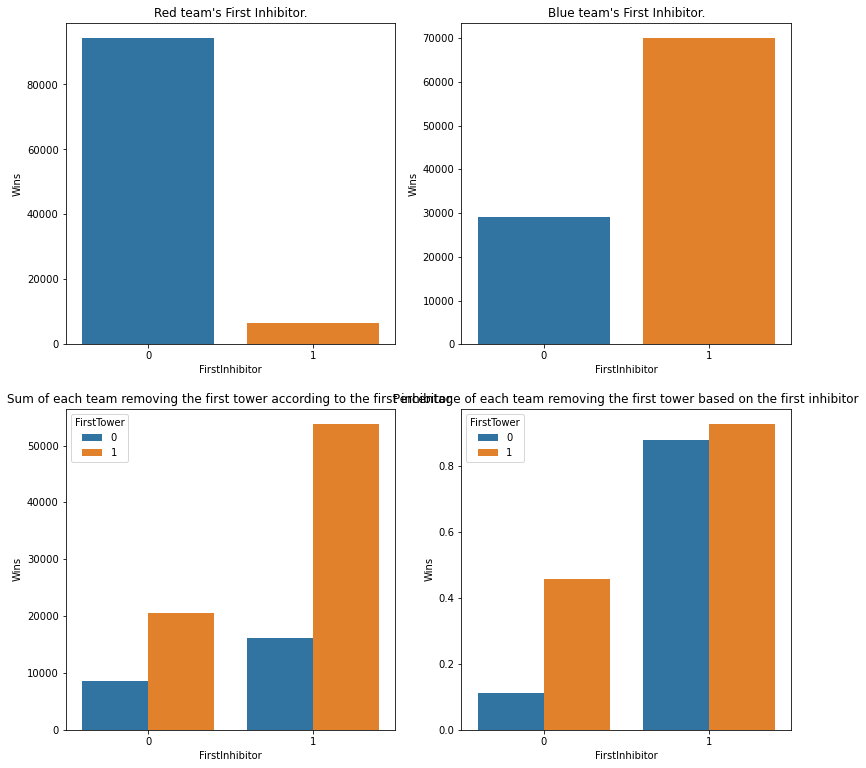

In [41]:
f, ax = plt.subplots(2,2, figsize = [13,13])

ax[0][0].set_title("Red team's First Inhibitor.")
sns.barplot(data=b.groupby('FirstInhibitor').count().reset_index(), x = 'FirstInhibitor', y = 'Wins', ax = ax[0][0])

ax[0][1].set_title("Blue team's First Inhibitor.")
sns.barplot(data=d.groupby('FirstInhibitor').count().reset_index(), x = 'FirstInhibitor', y = 'Wins', ax = ax[0][1])

ax[1][0].set_title("Sum of each team removing the first tower according to the first inhibitor.")
# 첫 번째 억제기에 따라 첫 번째 타워를 제거하는 각 팀의 합계.
sns.barplot(data=raw_data, x = 'FirstInhibitor', y = 'Wins', hue='FirstTower', ci = None, ax = ax[1][0], estimator=sum)

ax[1][1].set_title("Percentage of each team removing the first tower based on the first inhibitor")
# 첫 번째 억제기에 따라 첫 번째 타워를 제거하는 각 팀의 비율.
sns.barplot(data=raw_data, x = 'FirstInhibitor', y = 'Wins', hue='FirstTower', ci = None, ax = ax[1][1])

Text(0.5, 1.0, 'FirstInhibitor - Wins')

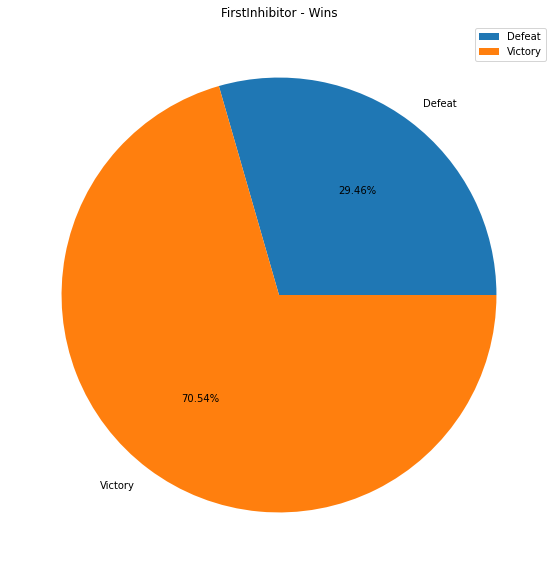

In [42]:
f_yd = d.groupby('FirstInhibitor').sum()
# d = c[c.Wins == 1]
# 블루팀이 첫 억제기를 제거하였을때 1 우승한 횟수의 합. 

# 블루팀이 기준이 되기때문에 라벨처리를 헷갈리지않게 표기.
# 0 -> 레드팀이 승리(Defeat)
# 1 -> 블루팀이 승리(Victory)
plt.figure(figsize=[30,10])
labels = ['Defeat', 'Victory']

plt.pie(x = f_yd['Wins'],  autopct = "%1.2f%%", labels = labels)
plt.legend(loc = 'upper right')
plt.title("FirstInhibitor - Wins")

# 용을 죽인 횟수에 따른 승패예측
##

In [43]:
# 블루팀의 상대팀 킬수
bdra = raw_data[['blueDragonKills', 'Wins']].groupby('blueDragonKills').mean()
bdra

,Wins
blueDragonKills,
0,0.223106
1,0.432533
2,0.691137
3,0.779985
4,0.870693
5,0.929672
6,0.758621
7,1.000000


<AxesSubplot:title={'center':'Blue Team wins by Dragon kills.'}, xlabel='blueDragonKills', ylabel='count'>

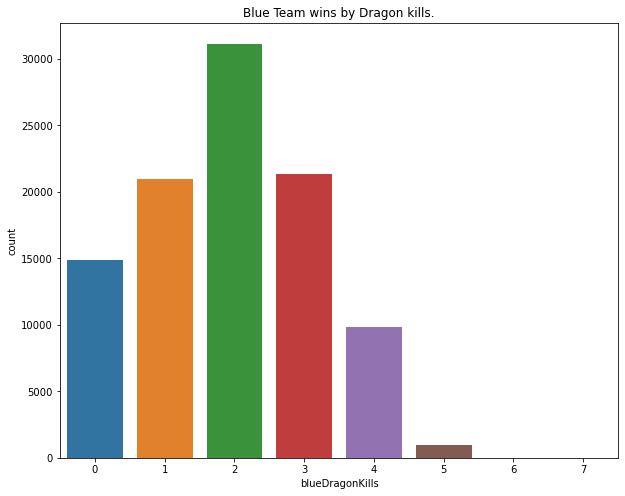

In [44]:
b_dra_w = raw_data[['blueDragonKills', 'Wins']]
b_dra_w = b_dra_w[b_dra_w['Wins'] == 1]
b_dra_w

plt.figure(figsize = [10, 8])
plt.title("Blue Team wins by Dragon kills.")
sns.countplot(data=b_dra_w, x = 'blueDragonKills')

# 머신러닝을 위한 데이터 추출

In [14]:
# 기본데이터의 컬럼 확인
raw_data.columns

Index(['gameDuraton', 'Wins', 'FirstBlood', 'FirstTower', 'FirstBaron',
       'FirstDragon', 'FirstInhibitor', 'blueDragonKills', 'blueBaronKills',
       'blueTowerKills', 'blueInhibitorKills', 'blueWardPlaced',
       'blueWardkills', 'blueKills', 'blueDeath', 'blueAssist',
       'blueChampionDamageDealt', 'blueTotalGold', 'blueTotalMinionKills',
       'blueTotalLevel', 'blueAvgLevel', 'blueJungleMinionKills',
       'blueKillingSpree', 'blueTotalHeal', 'blueObjectDamageDealt',
       'redDragonKills', 'redBaronKills', 'redTowerKills', 'redInhibitorKills',
       'redWardPlaced', 'redWardkills', 'redKills', 'redDeath', 'redAssist',
       'redChampionDamageDealt', 'redTotalGold', 'redTotalMinionKills',
       'redTotalLevel', 'redAvgLevel', 'redJungleMinionKills',
       'redKillingSpree', 'redTotalHeal', 'redObjectDamageDealt'],
      dtype='object')

# 머신러닝 데이터 선정
## 독립변수 : 첫 킬, 첫 타워, 첫 바론, 첫 용, 첫 억제기, 총 타워, 총 억제기
## 종속변수 : 승리

In [15]:
ml_raw_data = raw_data[['FirstBlood', 'FirstTower', 'FirstBaron', 'FirstDragon', 'FirstInhibitor',
                        'blueTowerKills', 'blueInhibitorKills','blueKills', 'Wins']]
ml_raw_data

,FirstBlood,FirstTower,FirstBaron,FirstDragon,FirstInhibitor,blueTowerKills,blueInhibitorKills,blueKills,Wins
0,1,1,0,0,0,4,0,7,0
1,0,1,0,0,0,3,0,6,0
2,0,0,1,1,1,9,2,30,1
3,1,1,0,1,0,5,0,26,1
4,1,1,0,1,0,3,0,19,0
...,...,...,...,...,...,...,...,...,...
199920,1,0,0,0,0,0,0,24,0
199921,1,1,0,1,0,5,1,29,0
199922,1,1,0,1,0,4,0,14,0
199923,1,0,0,1,0,5,0,32,1


# 문제 데이터, 정답 데이터 추려서 나누기

In [16]:
# 문제 데이터 설정하기
X = ml_raw_data.drop('Wins', axis=1)
X1 = X
X

,FirstBlood,FirstTower,FirstBaron,FirstDragon,FirstInhibitor,blueTowerKills,blueInhibitorKills,blueKills
0,1,1,0,0,0,4,0,7
1,0,1,0,0,0,3,0,6
2,0,0,1,1,1,9,2,30
3,1,1,0,1,0,5,0,26
4,1,1,0,1,0,3,0,19
...,...,...,...,...,...,...,...,...
199920,1,0,0,0,0,0,0,24
199921,1,1,0,1,0,5,1,29
199922,1,1,0,1,0,4,0,14
199923,1,0,0,1,0,5,0,32


In [17]:
# 정답 데이터 설정하기
y = ml_raw_data['Wins']
y

0         0
1         0
2         1
3         1
4         0
         ..
199920    0
199921    0
199922    0
199923    1
199924    1
Name: Wins, Length: 199925, dtype: int64

# 데이터 스케일링
## 서로 다른 변수의 값 범위를 일정한 수준으로 맞춰주기
## 각 피쳐의 평균을 0, 분산을 1로 변경 -> 모든특성이 같은 스케일을 가짐.

In [18]:
from sklearn.preprocessing import StandardScaler
# StandardScaler 사용

scaler = StandardScaler()
# 객체 생성

In [19]:
X = scaler.fit_transform(X)
# 스케일링한 결과를 X에 담는다
X

array([[ 0.9870144 ,  0.9687608 , -0.55684199, ..., -0.10183625,
        -0.71096876, -1.30867537],
       [-1.01315644,  0.9687608 , -0.55684199, ..., -0.39792437,
        -0.71096876, -1.38251842],
       [-1.01315644, -1.03224656,  1.79584159, ...,  1.37860436,
         1.48655806,  0.38971475],
       ...,
       [ 0.9870144 ,  0.9687608 , -0.55684199, ..., -0.10183625,
        -0.71096876, -0.79177403],
       [ 0.9870144 , -1.03224656, -0.55684199, ...,  0.19425188,
        -0.71096876,  0.53740084],
       [ 0.9870144 ,  0.9687608 , -0.55684199, ..., -0.10183625,
        -0.71096876, -1.08714623]])

In [20]:
from sklearn.model_selection import train_test_split

#트레이닝데이터, 테스트 데이터 분류
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=45)

In [21]:
X_train.shape

(159940, 8)

In [22]:
X_test.shape

(39985, 8)

In [23]:
y_train.value_counts()

0    80513
1    79427
Name: Wins, dtype: int64

In [24]:
y_test.value_counts()

0    20258
1    19727
Name: Wins, dtype: int64

# 로지스틱 회귀 분석(Logistic Regression) 모델 생성

In [40]:
from sklearn.linear_model import LogisticRegression

# 로지스틱 회귀분석 모델 객체 생성
model = LogisticRegression().fit(X_train, y_train) 

In [41]:
# 훈련 시키기 = > fit 함수 사용= 공부해라!!
model.fit(X_train, y_train) #문제와 답을 줌

LogisticRegression()

In [42]:
#훈련 모델 정확도 확인
#모델명.score(X_train, y_train)
print(model.score(X_train, y_train))

0.8555583343753907


In [43]:
# 로지스틱 회귀 분석 : (3)평가 데이터에 대한 예측 수행 -> 예측 결과 Y_predict 구하기
Y_predict = model.predict(X_test) #훈련된 모델에 테스트
Y_predict

array([0, 1, 0, ..., 1, 0, 1])

In [44]:
print(model.score(X_test ,y_test))

0.8548455670876579


#X2.iloc[len(X2)-1].to_list()
model.predict_proba([X2.iloc[len(X2)-1].to_list()]) # 레드팀 우승[0], 블루팀 우승[1]

In [45]:
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt

In [46]:
# 오차 행렬 test data set에 대한 분류기(classifier) 즉, 분류의 성능을 평가하는 행렬입니다
confusion_matrix(y_test, Y_predict) #(1,1)과 (2,2)를 보면 정확도 알수 있음

array([[17719,  2539],
       [ 3265, 16462]])

In [47]:
acccuracy = accuracy_score(y_test, Y_predict) #정확도 계산
precision = precision_score(y_test, Y_predict) #정밀도 : 
recall = recall_score(y_test, Y_predict) #실제 환자중 정확
f1 = f1_score(y_test, Y_predict) 
roc_auc = roc_auc_score(y_test, Y_predict)

In [48]:
print('정확도 면적: ', roc_auc)

정확도 면적:  0.8545787988569394


In [49]:
print('정확도: {0:.3f}, 정밀도: {1:.3f}, 재현율: {2:.3f},  F1: {3:.3f}'.format(acccuracy,precision,recall,f1))

정확도: 0.855, 정밀도: 0.866, 재현율: 0.834,  F1: 0.850


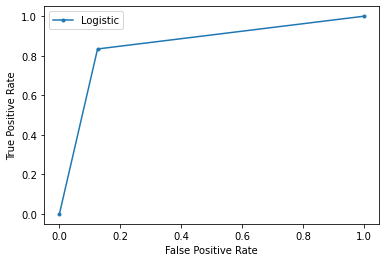

In [50]:
#ROC그림
# X_train, X_test, y_train, y_test
# calculate roc curves
lr_fpr, lr_tpr, _ = roc_curve(y_test, Y_predict)
 
# plot the roc curve for the model
plt.plot(lr_fpr, lr_tpr, marker='.', label='Logistic')
 
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
 
# show the legend
plt.legend()
 
# show the plot
plt.show()

# Sklearn LogisticRegression 주요 하이퍼 파라미터

## penalty : 규제의 유형을 설정하는 것
 - L2: Ridge, 일반적으로 사용 (default)
 - L1: LASSO, 변수가 많아서 줄여야할 때 사용, 모델의 단순화 및 해석에 용이
 
## C(Cost Function) : 규제 강도를 조절하는 alpha값의 역수 ~> C = 1/alpha
 - C 값 (기본값 = 1)
 - C 값이 작으면 Penalty 강해짐 (단순 모델 : 모델이 과적합된 경우 일반화 성능을 높이기 위해 사용)
 - C 값이 크면 Penalty 약해짐 (정규화 없어짐 : 모델이 과소적합된 경우 학습 성능을 높이기 위해 사용)
 
   보통 로그스케일로 지정(10배씩) = 0.01, 0.1, 1, 10

### GridSearchCV를 이용하여 하이퍼 파라미터 최적화 하기

### 상관관계를 통해 피쳐 정리

In [67]:
import warnings
warnings.filterwarnings(action='ignore')
from sklearn.model_selection import GridSearchCV

In [68]:
#파라미터 후보
params={'penalty':['l2', 'l1'],
        'C':[0.00001,0.0001,0.001,0.01, 0.1, 1]}
#0.001, 0.01, 0.1, 1, 10, 100

# 그리드 서치 진행
#GridSearchCV(model, param_grid = , cv = 2 or kFold(2))
lr_gs_model = GridSearchCV(model, param_grid=params, scoring='accuracy', cv= 3)
lr_gs_model.fit(X_train, y_train)

print('최적 하이퍼 파라미터:{0}, 최적 평균 정확도:{1:.3f}'.format(lr_gs_model.best_params_, 
                                                  lr_gs_model.best_score_))

최적 하이퍼 파라미터:{'C': 0.01, 'penalty': 'l2'}, 최적 평균 정확도:0.856


## 최적 하이퍼 파라미터를 사용하여 Logistic Regression 모델 생성

In [69]:
lr_model = LogisticRegression(penalty='l2', C = 0.01, solver= 'lbfgs').fit(X_train, y_train)
lr_model.score(X_train, y_train) #트레인 데이터로 확인한 결과

0.8555583343753907

In [70]:
#테스트 데이터를 통해 만들어둔 lr_model이 예측력이 좋은지 확인
Y_pred = lr_model.predict(X_test) 
Y_pred
accuracy_score(y_test, Y_pred)

0.8550206327372765

In [71]:
accuracy_score(y_test, Y_pred)

0.8550206327372765

In [72]:
# 오차 행렬 test data set에 대한 분류기(classifier) 즉, 분류의 성능을 평가하는 행렬입니다
confusion_matrix(y_test, Y_pred) #(1,1)과 (2,2)를 보면 정확도 알수 있음

array([[17722,  2536],
       [ 3261, 16466]])

In [73]:
acccuracy = accuracy_score(y_test,Y_pred) 
precision = precision_score(y_test, Y_pred) 
recall = recall_score(y_test, Y_pred) 
f1 = f1_score(y_test, Y_pred) 
roc_auc = roc_auc_score(y_test, Y_pred)

print('정확도 면적: ', roc_auc)
print('정확도: {0:.3f}, 정밀도: {1:.3f}, 재현율: {2:.3f},  F1: {3:.3f}'.format(acccuracy,precision,recall,f1))

정확도 면적:  0.854754227568838
정확도: 0.855, 정밀도: 0.867, 재현율: 0.835,  F1: 0.850


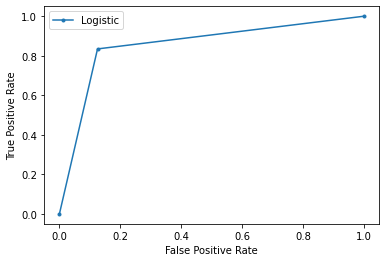

In [74]:
#ROC그림
# X_train, X_test, y_train, Y_test
# calculate roc curves
lr_fpr, lr_tpr, _ = roc_curve(y_test, Y_pred)
 
# plot the roc curve for the model
plt.plot(lr_fpr, lr_tpr, marker='.', label='Logistic')
 
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
 
# show the legend
plt.legend()
 
# show the plot
plt.show()

# SVM

In [55]:
from sklearn import svm

In [ ]:
svm_model = svm.SVC().fit(X_train, y_train)

In [ ]:
svm_model.score(X_train, y_train)

In [ ]:
print(svm_model)

In [ ]:
svm_pred = svm_model.predict(X_test)

In [ ]:
accuracy_score(y_test, svm_pred)

In [84]:
#gridSearchCV사용
#범위 좁혀가기 => 정확도들 보면서
param_grid = [{'kernel' : ['linear'], 'C' : [0.001, 0.005, 0.01, 0.1, 0.5]},
              {'kernel' : ['rbf'], 'C' : [0.01, 0.1,0.5], 'gamma' : [0.01,0.03,0.05,0.1,0.3,0.5]}] # C값은 0.01 ~ 10 까지 해서 줄여가면서
                                                                                                   # 10 -> 1.0 까지 좁혀가보기
svm_grid_model = GridSearchCV(svm_model, param_grid= param_grid, cv = 2, scoring='accuracy', n_jobs=-1,verbose=1).fit(X_train, y_train)

svm_grid_model.best_params_

Fitting 2 folds for each of 23 candidates, totalling 46 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.


KeyboardInterrupt: 

In [ ]:
svm_grid_model.score(X_train, y_train)

### 최적화 파라미터 값을 통해 생성한 SVM
#### 그리드 서치를 통해 얻은 최적화 하이퍼파라미터를 넣은 svm모델 생성
#### 모델의 트레이닝 정확도, 테스트 정확도 => 오버피팅 발생 train_acc : 0.928, test_acc : 0.764
#### gamma 값을 변경해가며(범위에있는) 오버피팅을 줄여줌 => 하나 고정으로 두고

In [52]:
new_svm_model2 = svm.SVC(C=0.5,gamma=0.09, kernel= 'rbf',probability=True).fit(X_train, y_train)
new_svm_model2.score(X_train, y_train)

NameError: name 'svm' is not defined

In [53]:
new_svm_pred = new_svm_model2.predict(X_test)
new_svm_pred

NameError: name 'new_svm_model2' is not defined

In [54]:
accuracy_score(y_test, new_svm_pred)

NameError: name 'new_svm_pred' is not defined

In [ ]:
# 오차 행렬 
confusion_matrix(y_test,new_svm_pred) #(1,1)과 (2,2)를 보면 정확도 알수 있음

In [ ]:
acccuracy = accuracy_score(y_test, new_svm_pred) 
precision = precision_score(y_test, new_svm_pred) 
recall = recall_score(y_test, new_svm_pred) 
f1 = f1_score(y_test, new_svm_pred) 
roc_auc = roc_auc_score(y_test, new_svm_pred)

print('정확도 면적: ', roc_auc)
print('정확도: {0:.3f}, 정밀도: {1:.3f}, 재현율: {2:.3f},  F1: {3:.3f}'.format(acccuracy,precision,recall,f1))

In [ ]:
# X_train, X_test, y_train, y_test
# calculate roc curves
svm_fpr, svm_tpr, _ = roc_curve(y_test, new_svm_pred)
 
# plot the roc curve for the model
plt.plot(svm_fpr, svm_tpr, marker='.', label='SVM')

#title
plt.title("ROC")
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
 
# show the legend
plt.legend()
 
# show the plot
plt.show()

# xgboost

In [25]:
from sklearn.model_selection import GridSearchCV
from xgboost import plot_importance
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix

In [26]:
xgb = XGBClassifier(n_estimator = 500, learnin_rate = 0.1, max_depth = 4,random_state=45).fit(X_train, y_train)
xgb_pred = xgb.predict(X_test)

/Users/joy/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:21:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { learnin_rate, n_estimator } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:21:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [27]:
xgb.score(X_train, y_train)

0.877078904589221

In [30]:
accuracy_score(y_test, xgb_pred)

0.873952732274603

In [32]:
# 그리드 서치
xgb_param_grid ={
    'n_estimators': [100,200,400,600],
    'learning_rate': [0.01, 0.05, 0.1, 0.15, 0.2],
    'max_depth' : [4, 6, 8, 10, 12],
}

xgb_grid = GridSearchCV(xgb, param_grid = xgb_param_grid, scoring = "accuracy", n_jobs = -1, verbose = 1).fit(X_train, y_train)
xgb_grid.best_params_

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:   49.8s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed: 15.7min


KeyboardInterrupt: 

In [33]:
#그리드 서치 결과 하이퍼파라미터를 대입해도 오버피팅 발생 => 순차적으로 값을 변경해가며 오버피팅을 줄였다.
new_xgb = XGBClassifier(n_estimator = 500, learnin_rate = 0.1, max_depth = 3, random_state=45).fit(X_train, y_train)
new_xgb_pred = xgb.predict(X_test)

/Users/joy/opt/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:04:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:541: 
Parameters: { learnin_rate, n_estimator } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:04:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [34]:
new_xgb.score(X_train, y_train)

0.8747030136301113

In [35]:
accuracy_score(y_test, new_xgb_pred)

0.873952732274603

In [36]:
# 오차 행렬 
confusion_matrix(y_test,new_xgb_pred) #(1,1)과 (2,2)를 보면 정확도 알수 있음

array([[17561,  2697],
       [ 2343, 17384]])

In [37]:
acccuracy = accuracy_score(y_test, new_xgb_pred) 
precision = precision_score(y_test, new_xgb_pred) 
recall = recall_score(y_test, new_xgb_pred) 
f1 = f1_score(y_test, new_xgb_pred) 
roc_auc = roc_auc_score(y_test, new_xgb_pred)

print('정확도 면적: ', roc_auc)
print('정확도: {0:.3f}, 정밀도: {1:.3f}, 재현율: {2:.3f},  F1: {3:.3f}'.format(acccuracy,precision,recall,f1))

정확도 면적:  0.874048091576888
정확도: 0.874, 정밀도: 0.866, 재현율: 0.881,  F1: 0.873


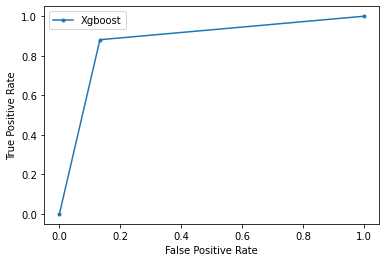

In [38]:
# X_train, X_test, y_train, y_test
# calculate roc curves
xgb_fpr, xgb_tpr, _ = roc_curve(y_test, new_xgb_pred)
 
# plot the roc curve for the model
plt.plot(xgb_fpr, xgb_tpr, marker='.', label='Xgboost')
 
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
 
# show the legend
plt.legend()
 
# show the plot
plt.show()

# ROC

In [51]:
#ROC그림
# logistic regression
# svm
# xgboost 
lr_fpr, lr_tpr, _ = roc_curve(y_test, Y_predict)
svm_fpr, svm_tpr, _ = roc_curve(y_test, new_svm_pred)
xgb_fpr, xgb_tpr, _ = roc_curve(y_test, new_xgb_pred)

# calculate scores
lr_auc = roc_auc_score(y_test, Y_predict)
svm_auc = roc_auc_score(y_test, new_svm_pred)
xgboost_auc = roc_auc_score(y_test, new_xgb_pred)

# summarize scores
print('Logistic: ROC AUC=%.2f' % (lr_auc))
print('SVM: ROC AUC=%.2f' % (svm_auc))
print('Xgboost: ROC AUC=%.2f' % (xgboost_auc))

# plot the roc curve for the model
plt.plot(lr_fpr, lr_tpr, marker='.', label='Logistic Regression')
plt.plot(svm_fpr, svm_tpr, marker='.', label='SVM')
plt.plot(xgb_fpr, xgb_tpr, marker='.', label='Xgboost')

# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.title("ROC")

# show the legend
plt.legend()
 
# show the plot
plt.show()

NameError: name 'new_svm_pred' is not defined

# 예측해보기



In [ ]:
#성별(F,M) ,동거여부(A,T) , 어머니교육수준(0,1,2,3,4), 아빠교육수준(0,1,2,3,4), 
#엄마직업(at_home ,health , other, service, teacher), 아빠직업(at_home ,health , other, service, teacher), 
#보호자(father, mother, other), 가족관계(1,2,3,4,5)

a = []
for i in range(8):
    a.append(input())

pred_test = {'sex': [a[0]],'Pstatus':[a[1]],'Medu':[a[2]],'Fedu':[a[3]],'Mjob':[a[4]],'Fjob':[a[5]],'guardian':[a[6]],'famrel':[a[7]]}
ddff = pd.DataFrame(pred_test)
ddff = pd.get_dummies(ddff)
ddff

In [ ]:
#원핫인코딩에 의해 여러 범주에 대한 컬럼이 생겨서 기존에 갖고 있던 문제 데이터를 새로운 변수로 받아주고
#새로운 데이터를 계속 쌓아서 사용
from sklearn.preprocessing import StandardScaler #StandardScaler 객체
scaler = StandardScaler() #객체 생성

X1 = X1 # X1은 위에서 문제데이터/정답데이터 나누는 부분에 생성한 변수
X2 = X1.append(ddff,ignore_index=True).fillna(0)
X2 = scaler.fit_transform(X2)
X2

In [ ]:
#예측하기
#모델.predict_proba를 사용하여 예측
new_svm_model2.predict_proba([X2[len(X2)-1]]) # 레드팀 승리[0], 블루팀 승리[1]

# KNN

In [ ]:
# Gradient Boosting Classifier 불러오기
from sklearn.ensemble import GradientBoostingClassifier 
from sklearn.metrics import accuracy_score
import time

# GBM 수행시간 측정을 위함. 시작시간 설정
start_time = time.time()

# 예시 데이터셋 불러오기
gb_clf = GradientBoostingClassifier(random_state=0)
gb_clf.fit(X_train, y_train.values)
gb_pred = gb_clf.predict(X_test)
gb_accuracy = accuracy_score(y_test, gb_pred)

print('GBM 정확도: {:.4f}'.format(gb_accuracy))
print('GBM 수행 시간: {:.1f}초'.format(time.time() - start_time))